In [2]:
using ITensors, ITensorMPS
using ITransverse
using ITensorExpMPO
using ITensors: Algorithm
using Plots
using Plots.PlotMeasures
using ProgressMeter
ProgressMeter.ijulia_behavior(:clear)

using Revise
includet("Alcaraz_2ndOrder_MPOgenerator.jl")

struct AlcarazModel <: ModelParams
    lambda::Float64
    p::Float64
    phys_site::Index
end

Hamiltonian given by:
$$H = -\sum_i \left( \sigma_i^z \sigma_{i+1}^z + \lambda \sigma_i^x \mathbf{+} p \sigma_i^z \sigma_{i+2}^z + p \lambda \sigma_i^x \sigma_{i+1}^x \right)$$

In [3]:
# System Parameters

# Alcaraz's NNN Self Dual Critical model
N = 50        
lambda = 1.0    # exact critical point (self dual)
p = 0.0         # NNN term (p>0 breakes system's integrability)
dt = 0.1       
T_max = 3     
cutoff = 1e-12
maxdim = 200

# Physical indices
sites = siteinds("S=1/2", N)

50-element Vector{Index{Int64}}:
 (dim=2|id=195|"S=1/2,Site,n=1")
 (dim=2|id=742|"S=1/2,Site,n=2")
 (dim=2|id=765|"S=1/2,Site,n=3")
 (dim=2|id=394|"S=1/2,Site,n=4")
 (dim=2|id=974|"S=1/2,Site,n=5")
 (dim=2|id=335|"S=1/2,Site,n=6")
 (dim=2|id=952|"S=1/2,Site,n=7")
 (dim=2|id=199|"S=1/2,Site,n=8")
 (dim=2|id=838|"S=1/2,Site,n=9")
 (dim=2|id=428|"S=1/2,Site,n=10")
 (dim=2|id=26|"S=1/2,Site,n=11")
 (dim=2|id=192|"S=1/2,Site,n=12")
 (dim=2|id=792|"S=1/2,Site,n=13")
 ⋮
 (dim=2|id=315|"S=1/2,Site,n=39")
 (dim=2|id=541|"S=1/2,Site,n=40")
 (dim=2|id=520|"S=1/2,Site,n=41")
 (dim=2|id=834|"S=1/2,Site,n=42")
 (dim=2|id=547|"S=1/2,Site,n=43")
 (dim=2|id=351|"S=1/2,Site,n=44")
 (dim=2|id=502|"S=1/2,Site,n=45")
 (dim=2|id=806|"S=1/2,Site,n=46")
 (dim=2|id=65|"S=1/2,Site,n=47")
 (dim=2|id=950|"S=1/2,Site,n=48")
 (dim=2|id=971|"S=1/2,Site,n=49")
 (dim=2|id=138|"S=1/2,Site,n=50")

### **HELPER FUNCTIONS**

In [4]:
# ALCARAZ MODEL

function compute_alcaraz_entropies(
    mpo_generator::Function, target_T::Float64;
    p::Float64=0.0, lambda::Float64=1.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    Ntime_steps = round(Int, target_T / dt)
    Nsteps = Ntime_steps + nbeta
    dbeta = -im * dt

    s = Index(2, "S=1/2")
    # init_state = up_state
    init_state = complex(state(s, "X+"))
    
    # Build tMPO blocks
    mp_alcaraz = AlcarazModel(lambda, p, s)
    tp = tMPOParams(dt, dbeta, mpo_generator, mp_alcaraz, nbeta, init_state)    
    b = FwtMPOBlocks(tp)
    
    # Power Method Params
    pm_params = PMParams(;
        truncp = (; cutoff=cutoff, maxdim=maxdim, alg=alg), 
        opt_method = :nosym, 
        cutoffs = [cutoff], 
        maxdims = 2:2:maxdim, 
        itermax = 5000, 
        eps_converged = eps_converged, 
        normalization = "overlap",
        stuck_after = 200,
        compute_fidelity = true
    )

    # Dynamically determine spatial bond dimension
    dummy_sites = siteinds("S=1/2", 4) 
    sample_mpo = mpo_generator(dummy_sites, lambda, p; dt=dt)
    spatial_bond_dim = dim(linkind(sample_mpo, 1))

    time_sites = addtags(siteinds(spatial_bond_dim, Nsteps), "time")
    mpo = fw_tMPO(b, time_sites; tr=tp.bl)
    start_mps = fw_tMPS(b, time_sites; tr=tp.bl, LR=:right)

    # Run Power Method
    psi_L, psi_R, _ = ITransverse.powermethod_lr(start_mps, mpo, mpo, pm_params)

    # Calculate entropy profiles (real & imaginary)
    p_r2_real = real.(ITransverse.gen_renyi2(psi_L, psi_R))
    p_r2_imag = imag.(ITransverse.gen_renyi2(psi_L, psi_R))

    bonds = 1:length(p_r2_real)

    return bonds, p_r2_real, p_r2_imag
end

function plot_entropy_evolution(
    mpo_generator::Function, 
    target_times::Vector{Float64};
    p::Float64=0.0, lambda::Float64=1.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    center_real = Float64[]
    center_imag = Float64[]
    actual_times = Float64[]

    # Top row: Profiles
    p_prof_real = plot(title="Re(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Re(S₂)", 
                       legend=:outertopright, grid=true)
    p_prof_imag = plot(title="Im(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Im(S₂)", 
                       legend=:outertopright, grid=true)
    
    # Bottom row: Center Bond Growth
    p_cent_real = plot(title="Re(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Re(S₂) Temp Ent.", 
                       legend=false, marker=:circle, lw=2, color=:blue, grid=true)
    p_cent_imag = plot(title="Im(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Im(S₂) Temp Ent.", 
                       legend=false, marker=:square, lw=2, color=:red, grid=true)

    n_times = length(target_times)
    colors_real = cgrad(:viridis, n_times, categorical=true)
    colors_imag = cgrad(:plasma, n_times, categorical=true)

    @showprogress for (i, T) in enumerate(target_times)
        bonds, r2_re, r2_im = compute_alcaraz_entropies(
            mpo_generator, T; 
            lambda=lambda, p=p, dt=dt, cutoff=cutoff, maxdim=maxdim, 
            alg=alg, eps_converged=eps_converged, nbeta=nbeta
        )

        # Normalize x axis
        n_bonds = length(r2_re)
        x_normalized = range(0.0, 1.0, length=n_bonds)
        
        center_idx = div(length(r2_re), 2) + 1
        push!(center_real, r2_re[center_idx])
        push!(center_imag, r2_im[center_idx])
        push!(actual_times, T)
        
        time_label = "t = $(round(T, digits=2))"
        
        plot!(p_prof_real, x_normalized, r2_re, label=time_label, lw=2, color=colors_real[i])
        plot!(p_prof_imag, x_normalized, r2_im, label=time_label, lw=2, color=colors_imag[i])
    end
    
    plot!(p_cent_real, actual_times, center_real)
    plot!(p_cent_imag, actual_times, center_imag)

    final_plot = plot(
        p_prof_real, p_prof_imag, p_cent_real, p_cent_imag, 
        layout=(2, 2), 
        size=(1200, 800),
        margin=5Plots.mm,
        plot_title="Alcaraz Model Temporal Entanglement (p=$p, lambda=$lambda)"
    )
    display(final_plot)
    
    return actual_times, center_real, center_imag
end

# ISING MODEL

function compute_ising_entropies(
    target_T::Float64;
    JXX::Float64=1.0, hz::Float64=1.0, gx::Float64=0.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    Ntime_steps = round(Int, target_T / dt)
    Nsteps = Ntime_steps + nbeta
    dbeta = -im * dt

    s = Index(2, "S=1/2")
    init_state = up_state
    
    # Build tMPO blocks
    mp_ising = IsingParams(JXX, hz, gx)
    tp = tMPOParams(dt, dbeta, expH_ising_murg, mp_ising, nbeta, init_state)    
    b = FwtMPOBlocks(tp)
    
    # Power Method Params
    pm_params = PMParams(;
        truncp = (; cutoff=cutoff, maxdim=maxdim, alg=alg), 
        opt_method = :nosym, 
        cutoffs = [cutoff], 
        maxdims = 2:2:maxdim, 
        itermax = 5000, 
        eps_converged = eps_converged, 
        normalization = "overlap",
        stuck_after = 200,
        compute_fidelity = true
    )

    time_sites = addtags(siteinds("S=1/2", Nsteps; conserve_qns=false), "time")
    mpo = fw_tMPO(b, time_sites; tr=tp.bl)
    start_mps = fw_tMPS(b, time_sites; tr=tp.bl, LR=:right)

    # Run Power Method
    psi_L, psi_R, _ = ITransverse.powermethod_lr(start_mps, mpo, mpo, pm_params)

    # Calculate entropy profiles (real & imaginary)
    p_r2_real = real.(ITransverse.gen_renyi2(psi_L, psi_R))
    p_r2_imag = imag.(ITransverse.gen_renyi2(psi_L, psi_R))

    bonds = 1:length(p_r2_real)

    return bonds, p_r2_real, p_r2_imag
end

function plot_ising_entropy_evolution(
    target_times::Vector{Float64};
    JXX::Float64=1.0, hz::Float64=1.0, gx::Float64=0.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    center_real = Float64[]
    center_imag = Float64[]
    actual_times = Float64[]

    # Top row: Profiles
    p_prof_real = plot(title="Re(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Re(S₂)", 
                       legend=:outertopright, grid=true)
    p_prof_imag = plot(title="Im(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Im(S₂)", 
                       legend=:outertopright, grid=true)
    
    # Bottom row: Center Bond Growth
    p_cent_real = plot(title="Re(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Re(S₂) Temp Ent.", 
                       legend=false, marker=:circle, lw=2, color=:blue, grid=true)
    p_cent_imag = plot(title="Im(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Im(S₂) Temp Ent.", 
                       legend=false, marker=:square, lw=2, color=:red, grid=true)

    n_times = length(target_times)
    colors_real = cgrad(:viridis, n_times, categorical=true)
    colors_imag = cgrad(:plasma, n_times, categorical=true)

    @showprogress for (i, T) in enumerate(target_times)
        bonds, r2_re, r2_im = compute_ising_entropies(
            T; 
            JXX=JXX, hz=hz, gx=gx, dt=dt, 
            cutoff=cutoff, maxdim=maxdim, 
            alg=alg, eps_converged=eps_converged, nbeta=nbeta
        )
        
        # Normalize x axis
        n_bonds = length(r2_re)
        x_normalized = range(0.0, 1.0, length=n_bonds)

        center_idx = div(length(r2_re), 2) + 1
        push!(center_real, r2_re[center_idx])
        push!(center_imag, r2_im[center_idx])
        push!(actual_times, T)
        
        time_label = "t = $(round(T, digits=2))"
        
        plot!(p_prof_real, x_normalized, r2_re, label=time_label, lw=2, color=colors_real[i])
        plot!(p_prof_imag, x_normalized, r2_im, label=time_label, lw=2, color=colors_imag[i])
    end
    
    plot!(p_cent_real, actual_times, center_real)
    plot!(p_cent_imag, actual_times, center_imag)

    final_plot = plot(
        p_prof_real, p_prof_imag, p_cent_real, p_cent_imag, 
        layout=(2, 2), 
        size=(1200, 800),
        margin=5Plots.mm,
        plot_title="Ising Model Temporal Entanglement (J=$JXX, hz=$hz, gx=$gx)"
    )
    display(final_plot)
    
    return actual_times, center_real, center_imag
end

plot_ising_entropy_evolution (generic function with 1 method)

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=150, normalize=overlap)   6%  ETA: 0:05:16 (67.18 ms/it)
   Info: [300]  chi=8 | ds=0.0005995636953892713 | <R|Rprev> = -7.603592140316738e-8┌ Warning: PM Stuck after 201/302 steps | ds=0.0005770685562624667 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:01:32


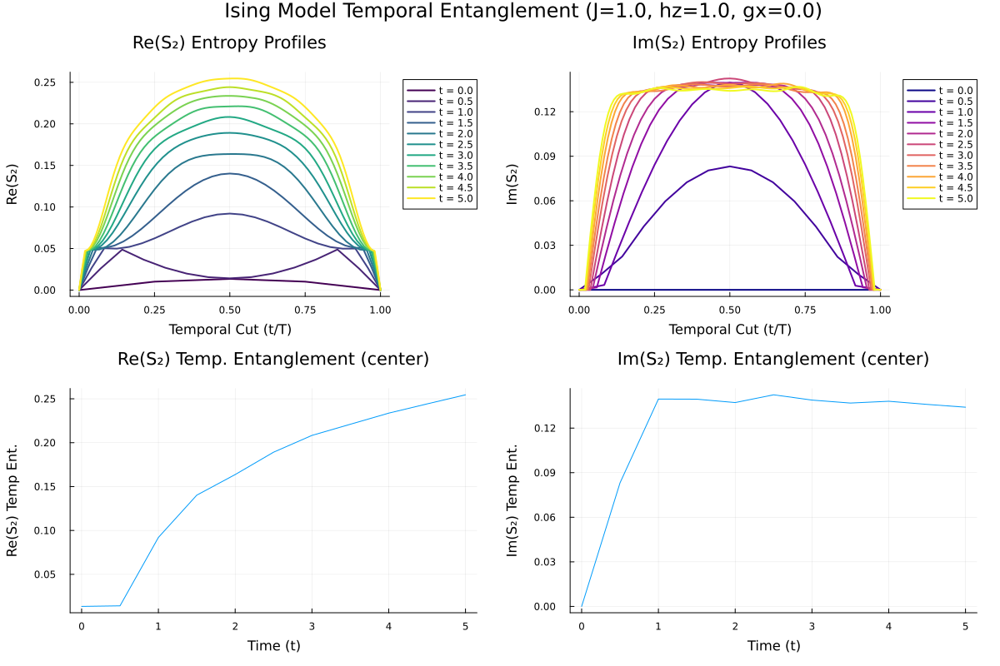

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.013442993109638255, 0.014102752099510455, 0.09204816428252244, 0.1402332904892373, 0.16369849897111236, 0.18918121426074172, 0.20831978579183508, 0.22102073722442547, 0.23369203372674807, 0.24421698162182212, 0.25456833749756763], [-0.0, 0.08315938762786883, 0.13953862971338396, 0.13945301855379724, 0.13717705927164592, 0.14239419977274617, 0.1388467266615361, 0.13684800445115622, 0.13805181611124479, 0.13594227807597523, 0.13405374619866378])

In [4]:
# Test times from t=0.2 to t=2.0
test_times = collect(0.0 : 0.5 : 5.0)

# Execute the simulation
times, c_real, c_imag = plot_ising_entropy_evolution(
    test_times;
    JXX = 1.0, 
    hz = 1.0,   # Transverse field (Set to 1.0 for the critical point if gx=0)
    gx = 0.0,   # Longitudinal field
    dt = 0.05,
    maxdim = 150
)

[PM LR|naiveRTM|nosym] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   6%  ETA: 0:05:01 (63.86 ms/it)
   Info: [294]  chi=8 | ds=0.0001531739916446062 | <R|Rprev> = -1.971818310994475e-5┌ Warning: PM Stuck after 201/296 steps | ds=0.0001287134678524815 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:01:10


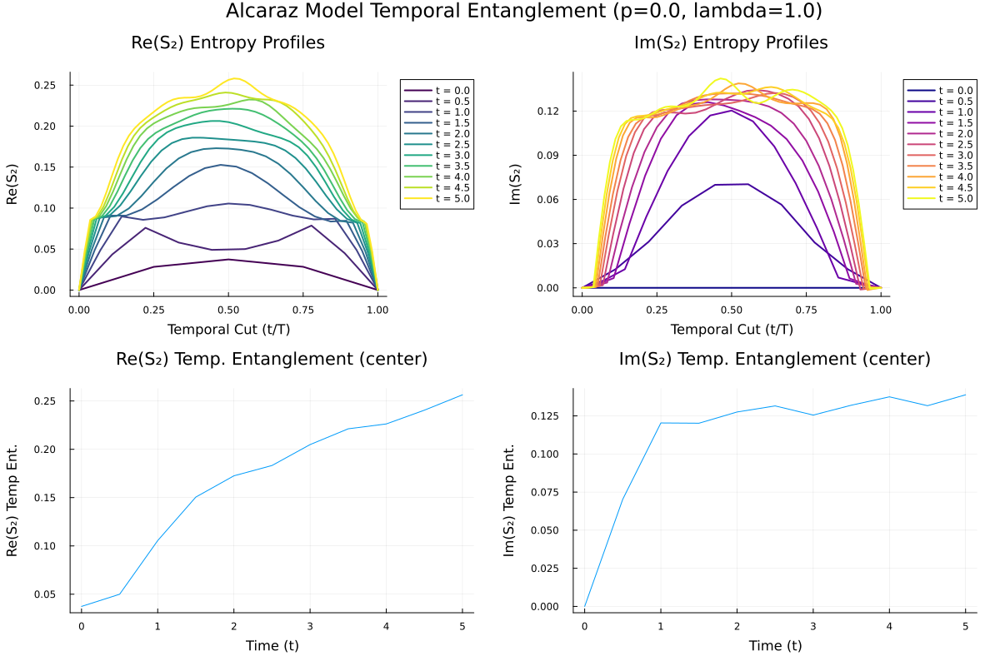

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.03738054702826673, 0.04998761609692083, 0.10554226845294643, 0.15055315423934246, 0.17255938985051658, 0.1832335117720885, 0.20488363220703226, 0.22120755528023986, 0.22624509274979956, 0.24048756184620218, 0.2563929812443166], [-0.0, 0.07032401226475034, 0.12035344184653744, 0.12018203829310804, 0.1275473290136446, 0.13153109718490893, 0.12552268762017538, 0.13199378465322226, 0.13749129173609406, 0.13166897349050533, 0.1388166744593414])

In [5]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_2nd_opt
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)   9%  ETA: 0:35:25 ( 0.47  s/it)
   Info: [468]  chi=8 | ds=0.0005069614896530128 | <R|Rprev> = -4.447143059630296e-6┌ Warning: PM Stuck after 201/469 steps | ds=0.0004781030761319416 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:10:08


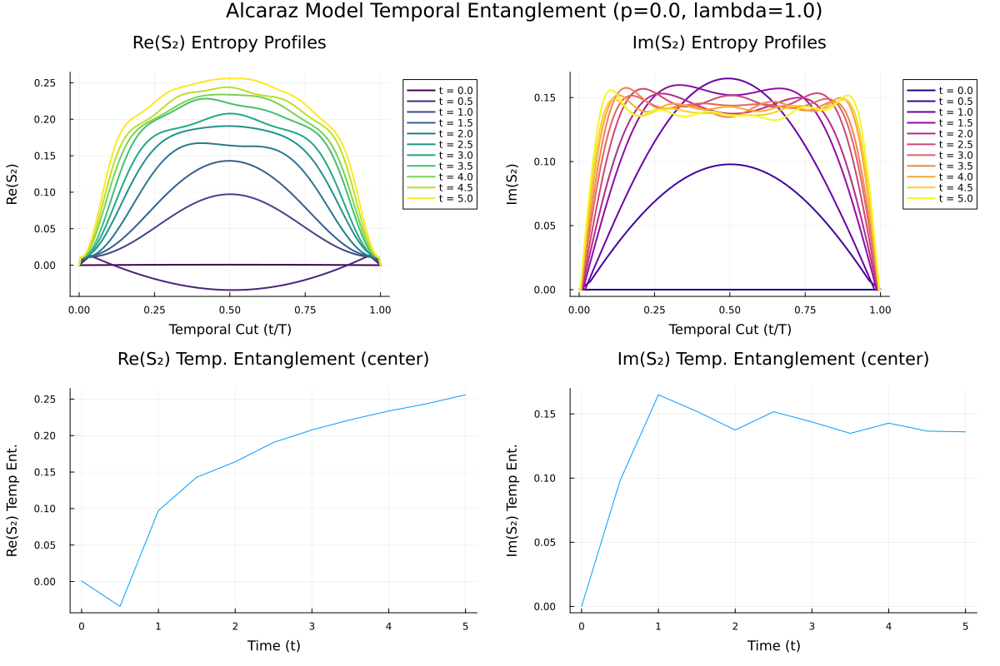

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.0007384617023865585, -0.03408496094523084, 0.09726104391691348, 0.14302837101135457, 0.16403106370814194, 0.19065795957980153, 0.20774498883416, 0.22167174956555133, 0.23365759278578666, 0.24377265730741005, 0.25585734492461404], [-2.0970798996670238e-21, 0.09788447911455579, 0.16489077348813874, 0.15197103386168878, 0.13744206822701918, 0.1516604609031672, 0.14374014498422993, 0.1348248095070122, 0.14280473682405995, 0.13660223117164905, 0.13600556063624694])

In [15]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_WII
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.01, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   2%  ETA: 0:03:30 (42.99 ms/it)
   Info: [124]  chi=10 | ds=2.0715634828638585e-6 | <R|Rprev> = -1.6558606337942667e-12[ Info: PM Converged after 125 steps | ds=9.840692726248434e-7 | chi=10)
Progress: 100%|█████████████████████████████████████████| Time: 0:00:16


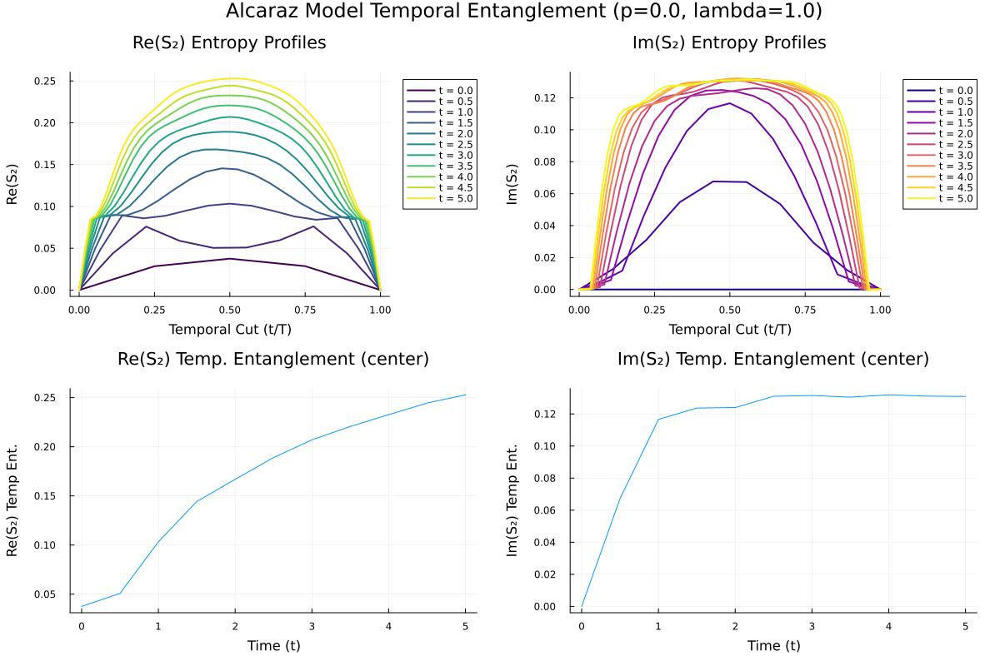

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.03755872367798243, 0.05082336358122106, 0.10327879761789573, 0.1442814179824568, 0.16685734525498377, 0.1890054282647641, 0.20700670117233408, 0.2206491380620707, 0.23265170928714066, 0.24445852310762803, 0.25283339381954084], [-1.773421650769145e-18, 0.06726777370281906, 0.11660643997185936, 0.12368224344729405, 0.12399906488115592, 0.13101315155697257, 0.13150618992435606, 0.1304772914313909, 0.13193490424957477, 0.13110766584433028, 0.13089243096284034])

In [13]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_WII
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   4%  ETA: 0:03:56 (48.89 ms/it)
   Info: [177]  chi=10 | ds=2.159855583605541e-6 | <R|Rprev> = -2.135304279072948e-12[ Info: PM Converged after 179 steps | ds=8.425342414852821e-7 | chi=10)
Progress: 100%|█████████████████████████████████████████| Time: 0:00:45


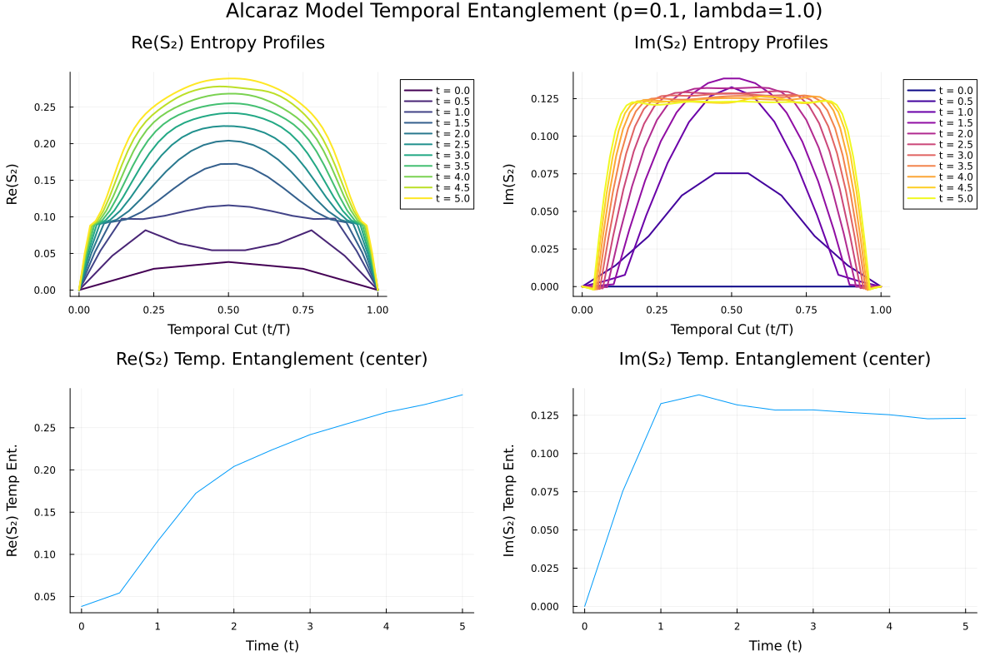

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.038372239466377564, 0.054378702110398726, 0.11578904705328316, 0.17240943390040875, 0.20414054550651506, 0.22387318570638587, 0.2418379920434218, 0.2551463614531172, 0.26831076464520787, 0.2774197425799538, 0.2890386871261243], [-4.90549514959812e-19, 0.07534847864794224, 0.13264398824519624, 0.1384093677787868, 0.13183112235365663, 0.12844603513890657, 0.1285357984705516, 0.12679986544897107, 0.12539496056475852, 0.12272554526599116, 0.1230536639213578])

In [10]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_WII
p_val = 0.1

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)  11%  ETA: 0:04:42 (63.43 ms/it)
   Info: [561]  chi=12 | ds=2.5884965498157442e-5 | <R|Rprev> = -2.5827621226488845e-6┌ Warning: PM Stuck after 201/562 steps | ds=2.2592017718592317e-5 | chi=12)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:01:25


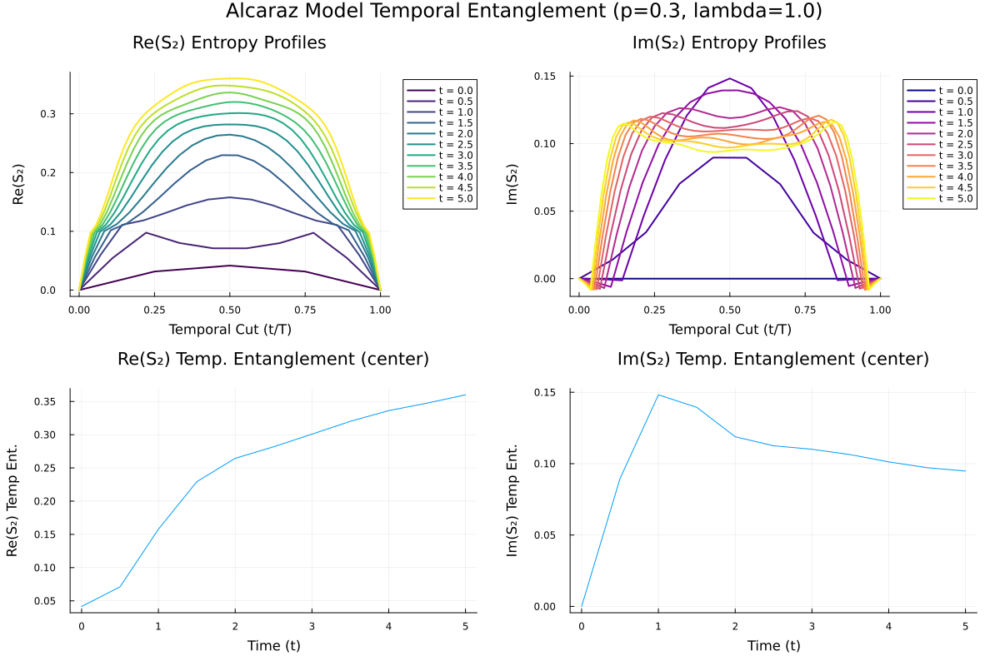

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.04162302125238966, 0.07106305818918845, 0.15777705880765944, 0.22930882009838618, 0.2644638283927604, 0.28180442796275385, 0.3008430196230163, 0.3201563356109165, 0.33622103304254686, 0.3475417265193526, 0.3600130742570154], [2.833874348205557e-18, 0.08951270524354096, 0.14822569110651798, 0.1394401506535898, 0.11883714425472686, 0.11251619039073277, 0.11006523384351848, 0.1063071068432118, 0.10123251833148805, 0.09716363170422765, 0.09483150171712466])

In [11]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_WII
p_val = 0.3

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   8%  ETA: 0:06:49 (88.98 ms/it)
   Info: [402]  chi=14 | ds=3.589321543720492e-5 | <R|Rprev> = -1.5773077561842541e-6┌ Warning: PM Stuck after 201/403 steps | ds=3.5781480962809864e-5 | chi=14)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:02:19


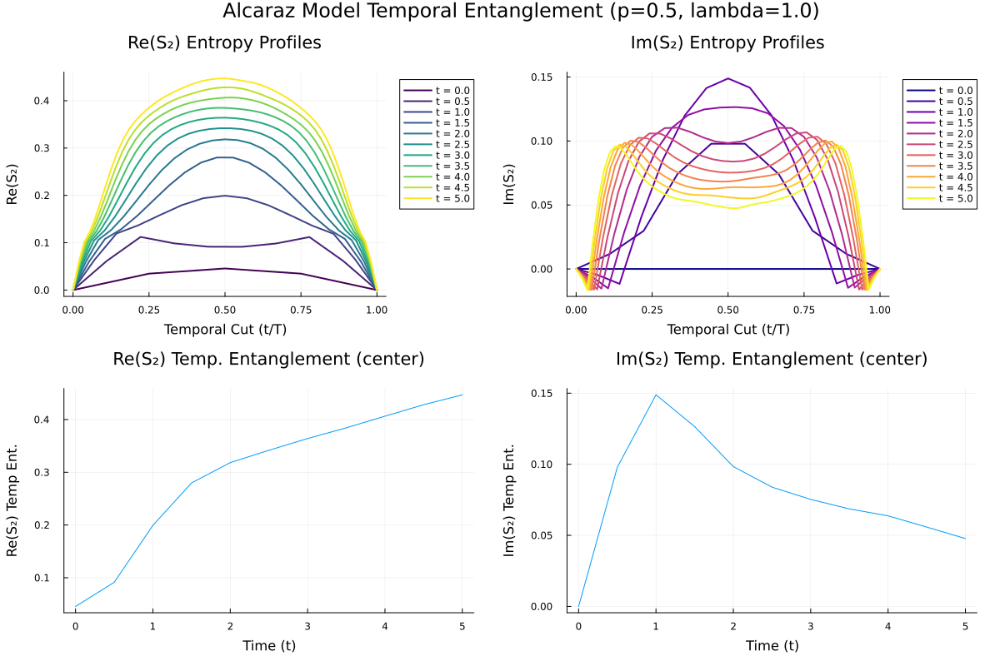

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.0455909118056924, 0.09132574352601258, 0.19936550930102542, 0.2798407381692024, 0.3183712880523587, 0.34178019837664725, 0.3640280111230677, 0.38436935296359387, 0.40640431841219066, 0.4281893028074069, 0.44693488392856145], [1.0543606274131314e-17, 0.09786387909336228, 0.14887209501009502, 0.1264937606419755, 0.09835619569799867, 0.0838966402584785, 0.0752652258952432, 0.06858668358880553, 0.0637226704636227, 0.055806739321763714, 0.047732433102716375])

In [12]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_WII
p_val = 0.5

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250,
)

---

In [5]:
"""
Builds the Alcaraz MPO using the automated OpSum-to-MPO Euler builder.
Uses Algorithm("WII") exactly as specified in the package examples.
"""
function expH_alcaraz_euler(sites::Vector{<:Index}, lambda::Number, p::Number; dt::Number, alg_name::String="WII")
    N = length(sites)
    os = OpSum()

    # 1. Nearest-Neighbor terms
    for j in 1:(N - 1)
        os += -1.0, "Z", j, "Z", j + 1
        os += -p * lambda, "X", j, "X", j + 1
    end

    # 2. Next-Nearest-Neighbor terms
    for j in 1:(N - 2)
        os += -p, "Z", j, "Z", j + 2
    end

    # 3. On-site Transverse Field
    for j in 1:N
        os += -lambda, "X", j
    end

    # Time step conversion for exp(-i * H * dt)
    tau = -im * dt 
    
    # Call the expmpo function using the safe Algorithm("WII") syntax
    return expmpo(os, sites, tau; alg=Algorithm(alg_name))
end

expH_alcaraz_euler

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   6%  ETA: 0:05:28 (69.62 ms/it)
   Info: [292]  chi=8 | ds=0.0003067949905857237 | <R|Rprev> = -8.456705616653417e-8┌ Warning: PM Stuck after 201/294 steps | ds=0.0005496505837601084 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:00:57


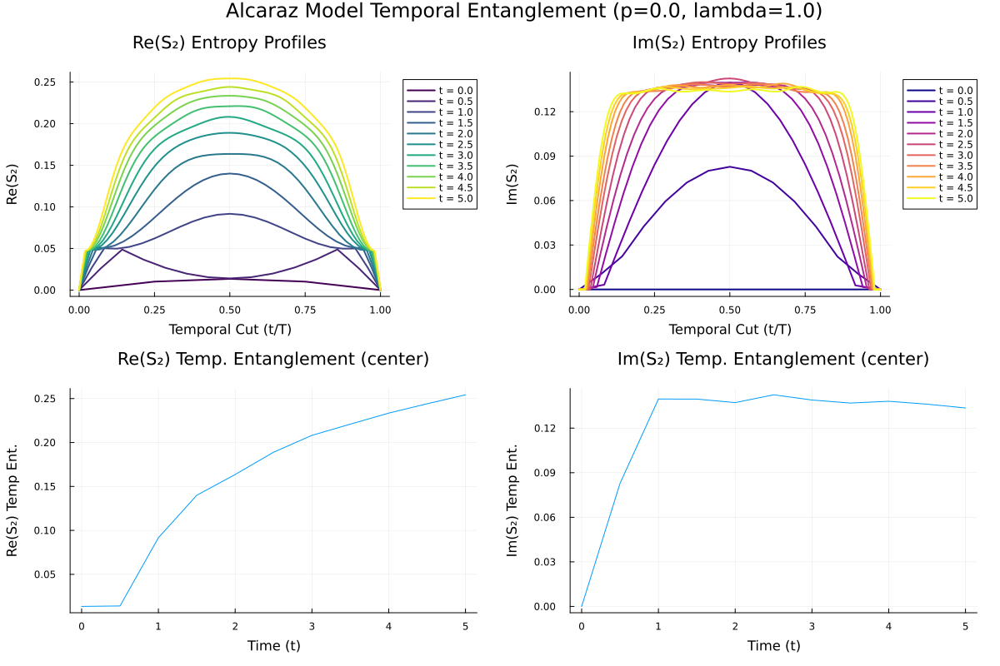

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.013479273346380551, 0.014002238260800328, 0.09162634778237706, 0.1400079359973874, 0.16358189669539694, 0.18895039227258556, 0.2081442190645224, 0.22091226571752773, 0.23347086350963892, 0.24410158935297024, 0.2542817155325475], [-0.0, 0.08281199028057688, 0.1395840666394611, 0.13955943166016377, 0.13718492394936257, 0.142427661167824, 0.13892398910838238, 0.13689156051382315, 0.13807109254867753, 0.1361187661319834, 0.13355578157452935])

In [9]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)  12%  ETA: 0:06:02 (82.38 ms/it)
   Info: [602]  chi=8 | ds=6.024446379016002e-5 | <R|Rprev> = -5.140725980798613e-8┌ Warning: PM Stuck after 201/604 steps | ds=5.995485559093239e-5 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:02:01


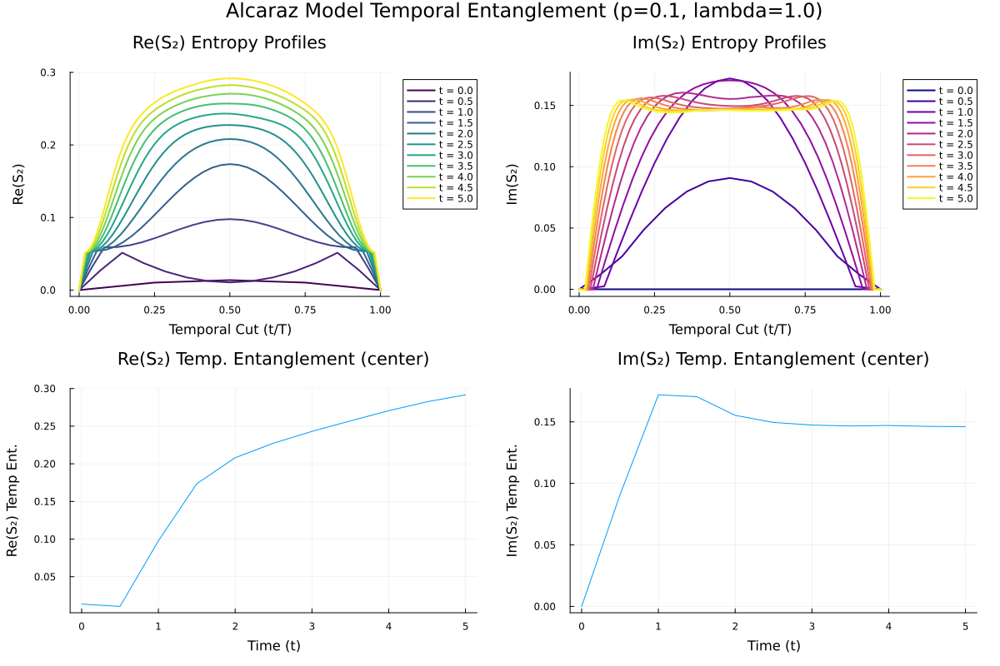

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.013700043821241402, 0.010593748168104813, 0.09774431410584701, 0.17355189965382495, 0.20812730773096144, 0.22743742840128128, 0.24305049434220977, 0.2569973752688952, 0.2705381057174628, 0.28241794488310623, 0.2916283553690174], [-0.0, 0.09076875411536339, 0.1720061711164564, 0.17045497676836394, 0.15528742441477636, 0.14951349381321424, 0.1474154383633136, 0.14666850652241367, 0.14709133729872198, 0.1463381152637705, 0.14615245206644972])

In [16]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = 0.1

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   9%  ETA: 0:09:44 ( 0.13  s/it)
   Info: [427]  chi=13 | ds=9.501615298090904e-5 | <R|Rprev> = -3.195620724876054e-8┌ Warning: PM Stuck after 201/428 steps | ds=9.505334318293812e-5 | chi=14)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:04:00


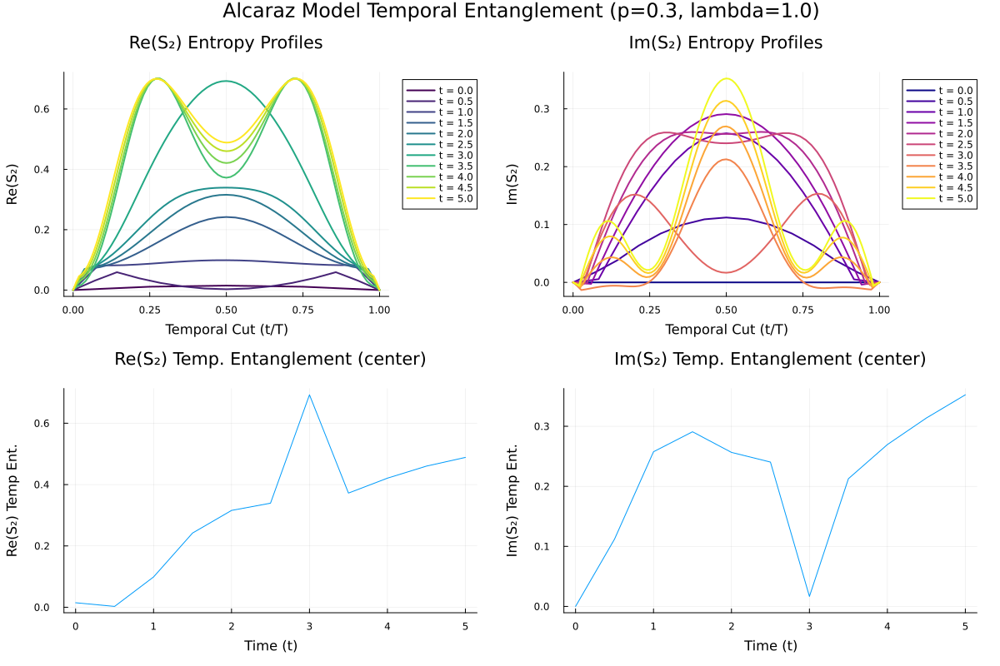

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.014753885480537797, 0.002783239540687503, 0.0989184198139974, 0.24204326682019148, 0.3157672961518546, 0.33937836220486595, 0.6927116608394016, 0.37231013714112504, 0.42095378543514345, 0.4602090319118338, 0.48861636847729417], [-0.0, 0.11212608461460165, 0.2576442896693509, 0.2908887315457099, 0.2565191723651552, 0.24040236055196929, 0.0166179925272819, 0.21271271216572152, 0.2695824494315734, 0.3138092763274275, 0.35244930020890314])

In [17]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = 0.3

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   2%  ETA: 0:11:13 ( 0.14  s/it)
   Info: [104]  chi=12 | ds=1.0737015566641972e-6 | <R|Rprev> = -1.8679075380462635e-13[ Info: PM Converged after 105 steps | ds=8.738084229520382e-7 | chi=12)
Progress: 100%|█████████████████████████████████████████| Time: 0:02:48


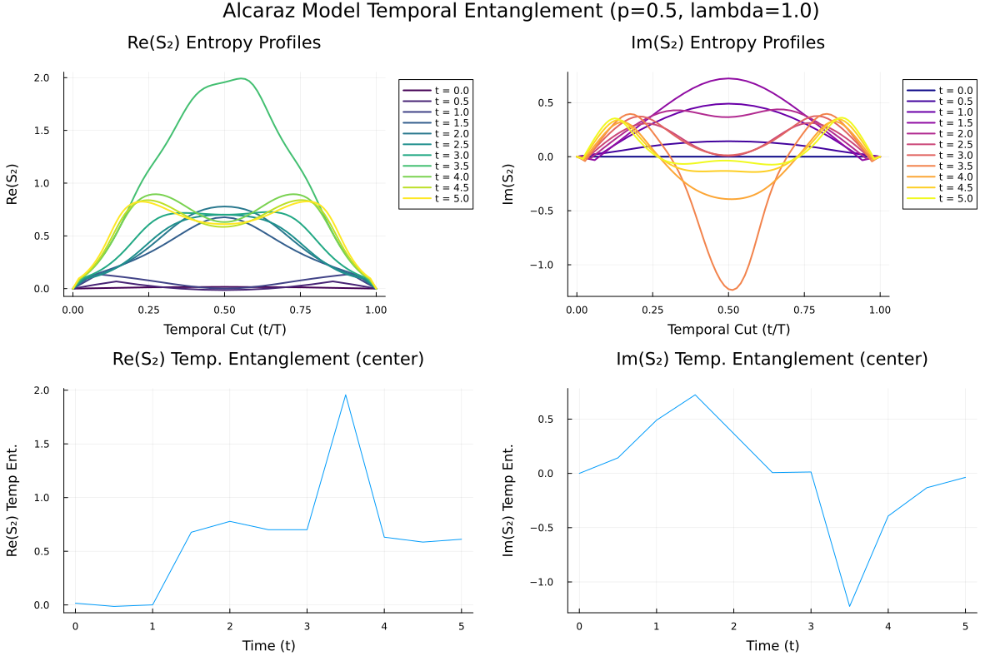

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.016395184040365635, -0.013721233114298521, 0.0006207276515081334, 0.6768293540008323, 0.7783280853245202, 0.7004447904375102, 0.7006758452624843, 1.9570270127466747, 0.6309572472019893, 0.5853656030269591, 0.6117668167023933], [-0.0, 0.1430189187402181, 0.4902295818758038, 0.7237053601537822, 0.3657612996768665, 0.006887554698294187, 0.012779020029786462, -1.225615654236326, -0.39275739016682154, -0.13227118607664987, -0.036821579436722776])

In [18]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = 0.5

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250,
)

[PM LR|densitymatrix|nosym] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   2%  ETA: 5:50:30 ( 4.28  s/it)
   Info: [85]  chi=100 | ds=1.315497094922513e-6 | <R|Rprev> = -6.047030397783059e-12[ Info: PM Converged after 86 steps | ds=9.670452691956655e-7 | chi=100)
Progress: 100%|█████████████████████████████████████████| Time: 0:44:33


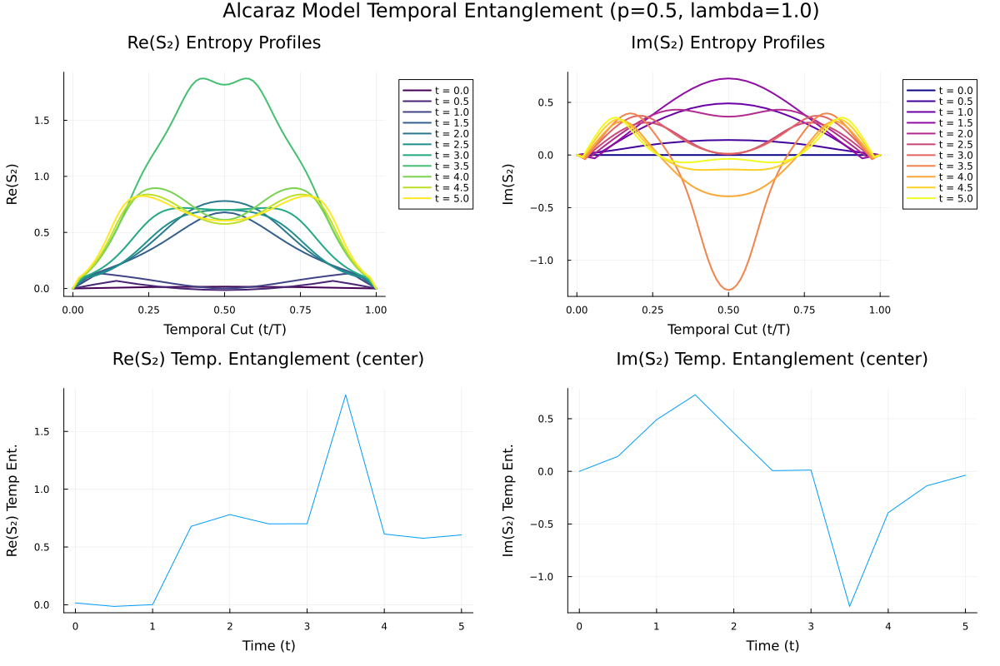

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.01640370835412015, -0.01401772932395907, 0.001252624193990926, 0.679369466146884, 0.7805058714788566, 0.700653757310657, 0.7008213915183297, 1.8169577670706272, 0.6119998538209237, 0.5755980375494097, 0.6044897769912358], [-0.0, 0.14269891180268054, 0.49063762404082495, 0.727303204614325, 0.3643340495218776, 0.0066633549035234494, 0.012286987849274966, -1.2830083979833318, -0.39241380784604135, -0.13692557107790967, -0.03688040543951632])

In [20]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = 0.5

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250, alg="densitymatrix"
)

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   9%  ETA: 0:31:27 ( 0.41  s/it)
   Info: [444]  chi=30 | ds=1.8313039970352385e-5 | <R|Rprev> = -4.699835013837024e-7┌ Warning: PM Stuck after 201/445 steps | ds=2.5428317904752085e-5 | chi=30)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:07:11


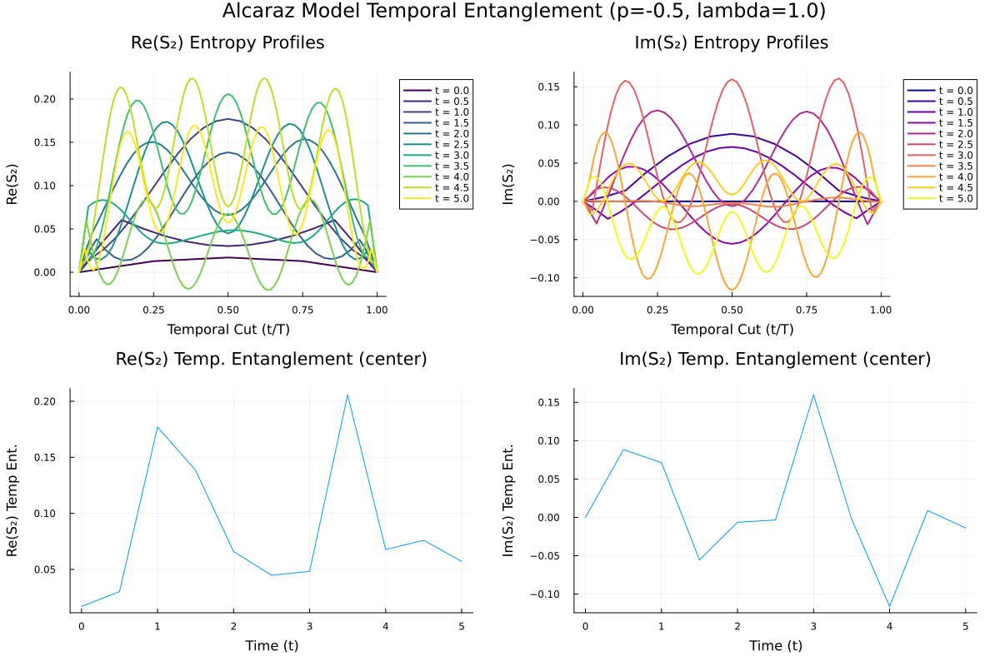

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.016994393003037244, 0.03019820400693449, 0.1770046751013573, 0.13842128498763495, 0.06596129438182914, 0.044786347523394186, 0.0483166221648738, 0.20576983101884383, 0.06775117486161218, 0.07595407855673708, 0.05712012080291549], [-0.0, 0.08839034714699207, 0.07120870480673089, -0.05553815871550484, -0.006367441221084405, -0.003398588233862252, 0.15977241974537937, -0.002206413367937915, -0.11604938645217437, 0.008954833700322266, -0.013823185518113524])

In [19]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = -0.5

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250,
)

vamos a probar para p=0.3 con dt=0.1, 0.05, 0.02, 0.01

In [ ]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = 0.5

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   2%  ETA: 0:05:31 (67.57 ms/it)
   Info: [98]  chi=10 | ds=1.1844512799452644e-6 | <R|Rprev> = -1.5416885874915182e-12[ Info: PM Converged after 99 steps | ds=9.097711393124541e-7 | chi=10)
Progress: 100%|█████████████████████████████████████████| Time: 0:01:29


In [ ]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = 0.5

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250,
)

In [ ]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = 0.5

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.02, maxdim=250,
)

In [ ]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = 0.5

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.01, maxdim=250,
)